# Importing required libraries and the data set

In [1]:
#import required libraries 

import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mp
import matplotlib.pyplot as plt
import pydotplus
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from sklearn.metrics import classification_report
import researchpy as rp
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp

In [2]:
os.getcwd()
os.chdir(r"C:\Users\Snehal\Documents\Personal\snehal\Jobs and Internships\Full-time-After Internship\Penn National Gaming\Data Analyst Case Study\Data Science Case Study")

In [3]:
df = pd.read_csv('expByuser.csv')

In [4]:
df.head()

,Unnamed: 0,variant,entry_date,u_custom_platform,version_name,install_date,first_pay_date,playertype,revenue,bc,txns,heartbeats,spins,buypageviews,d1,d7,d14,revenue_before
0,1,0,01/30/2016,Amazon,1.16.0,08/27/2015,NaN,Existing - NonPayer,0.0,0,0,19,496,0,1,0,0,0.0
1,2,0,01/31/2016,Amazon,1.16.0,01/01/2016,NaN,Existing - NonPayer,0.0,0,0,5,106,0,0,0,0,0.0
2,3,1,01/25/2016,iOS,1.15.0,01/25/2016,NaN,New,0.0,0,0,2,6,0,0,0,0,0.0
3,4,1,01/27/2016,iOS,1.15.0,01/27/2016,NaN,New,0.0,0,0,11,422,0,0,0,0,0.0
4,5,1,01/16/2016,Android,1.15.0,11/05/2015,NaN,Existing - NonPayer,0.0,0,0,11,176,0,0,0,1,0.0


In [5]:
del df['Unnamed: 0']

# Data Exploration

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 433514 entries, 0 to 433513
Data columns (total 17 columns):
variant              433514 non-null int64
entry_date           433514 non-null object
u_custom_platform    433514 non-null object
version_name         433514 non-null object
install_date         433514 non-null object
first_pay_date       14511 non-null object
playertype           433514 non-null object
revenue              433514 non-null float64
bc                   433514 non-null int64
txns                 433514 non-null int64
heartbeats           433514 non-null int64
spins                433514 non-null int64
buypageviews         433514 non-null int64
d1                   433514 non-null int64
d7                   433514 non-null int64
d14                  433514 non-null int64
revenue_before       433514 non-null float64
dtypes: float64(2), int64(9), object(6)
memory usage: 56.2+ MB


In [7]:
#The columns with 'object' dtype are the possible categorical features in df dataset. 
# The reason why I am saying that these categorical features are 'possible' is because we shouldn't not completely rely 
# on .info() to get the real data type of the values of a feature, as some missing values that are represented as strings
#  in a continuous feature can coerce it to read them as object dtypes.


#In this case, variant, bc, d1, d7 and d14 are supposed to be categorical variables. However, they are identified as 
#an interger varibles.
#In Python, it's a good practice to typecast categorical features to a category dtype because they make the operations 
#on such columns much faster than the object dtype.

In [8]:
import datetime
df['entry_date'] = pd.to_datetime(df.entry_date)
df['install_date'] = pd.to_datetime(df.install_date)
df['first_pay_date'] = pd.to_datetime(df.first_pay_date)

In [9]:
df.dtypes

variant                       int64
entry_date           datetime64[ns]
u_custom_platform            object
version_name                 object
install_date         datetime64[ns]
first_pay_date       datetime64[ns]
playertype                   object
revenue                     float64
bc                            int64
txns                          int64
heartbeats                    int64
spins                         int64
buypageviews                  int64
d1                            int64
d7                            int64
d14                           int64
revenue_before              float64
dtype: object

In [10]:
#drop duplicate rows if any

df = df.drop_duplicates(keep = 'first')

In [11]:
#shape of the data

df.shape

(401769, 17)

# Data Visualization

# i. Purchase VS Variant

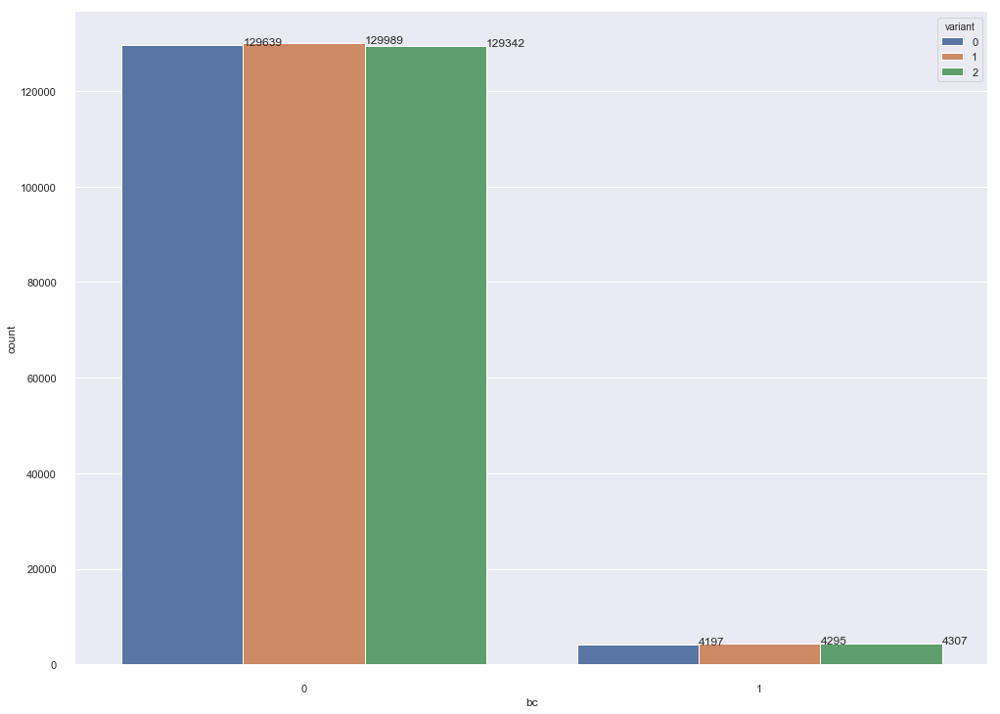

In [12]:
# set the background colour of the plot to white
sns.set(style="whitegrid", color_codes=True)
# setting the plot size for all plots
sns.set(rc={'figure.figsize':(16.7,12.27)})
# create a countplot
ax = sns.countplot('bc',data=df,hue = 'variant')

for p in ax.patches:
        length = p.get_height()
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()
        ax.annotate(length, (x, y))
# Remove the top and down margin
sns.despine(offset=10, trim=True)
# display the plot
plt.show()

Above barplot implies that the data set has MORE records of those users who DID NOT made a purchase during the experiment than records of those users who made purchase during the experiment. We can also see that Variant 1 is most opted option by all users. However, more users tend to make purchase when they use Variant 2.

# ii. Player Type Vs. Variant Type

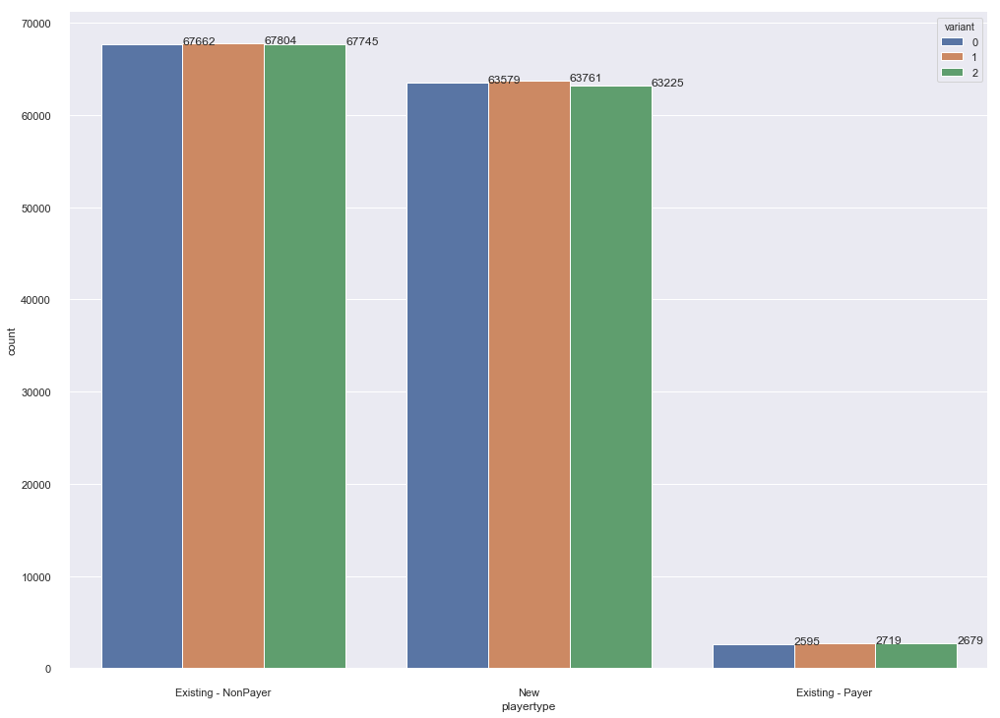

In [13]:
# create a countplot
ax = sns.countplot('playertype',data=df,hue = 'variant')

for p in ax.patches:
        length = p.get_height()
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()
        ax.annotate(length, (x, y))
# Remove the top and down margin
sns.despine(offset=10, trim=True)
# display the plot
plt.show()

From above barchart it is clear that Existing-Payers is making a purchase in the experiment followed by a New players. This shows that the game certainly has some engaging characteristics which are attracting players and make a purchase.

# iii. Platform Vs Variant

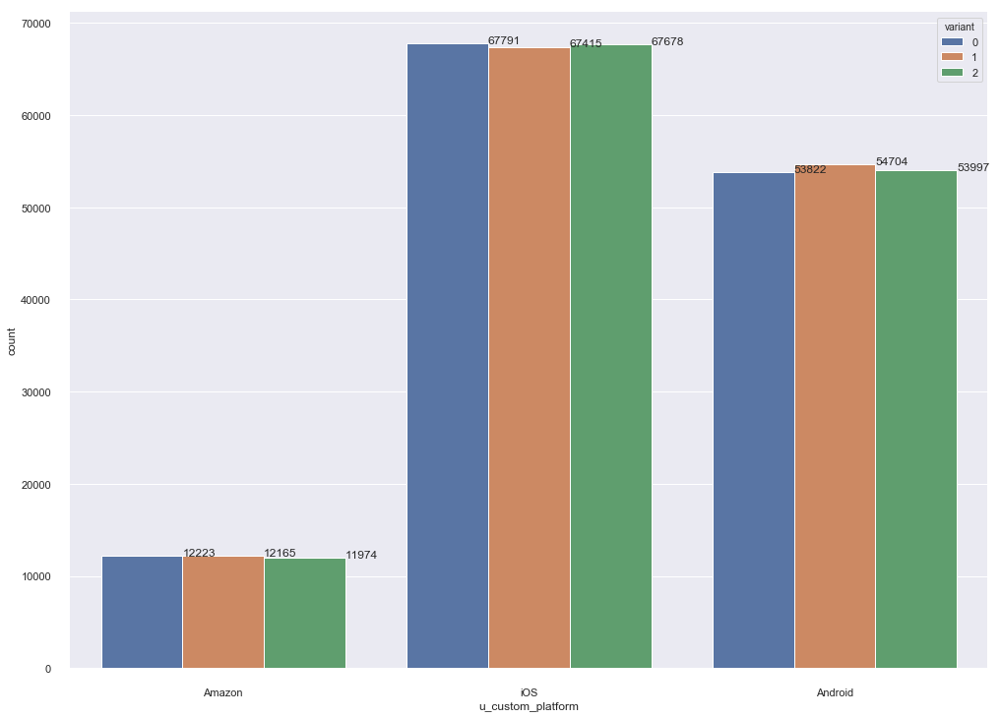

In [14]:
# create a countplot
ax = sns.countplot('u_custom_platform',data=df,hue = 'variant')

for p in ax.patches:
        length = p.get_height()
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()
        ax.annotate(length, (x, y))
# Remove the top and down margin
sns.despine(offset=10, trim=True)
# display the plot
plt.show()

From above barchart it is clear that iOS users are making a purchase in the experiment followed by a Android users.

# iv. Number of Spins VS Variant

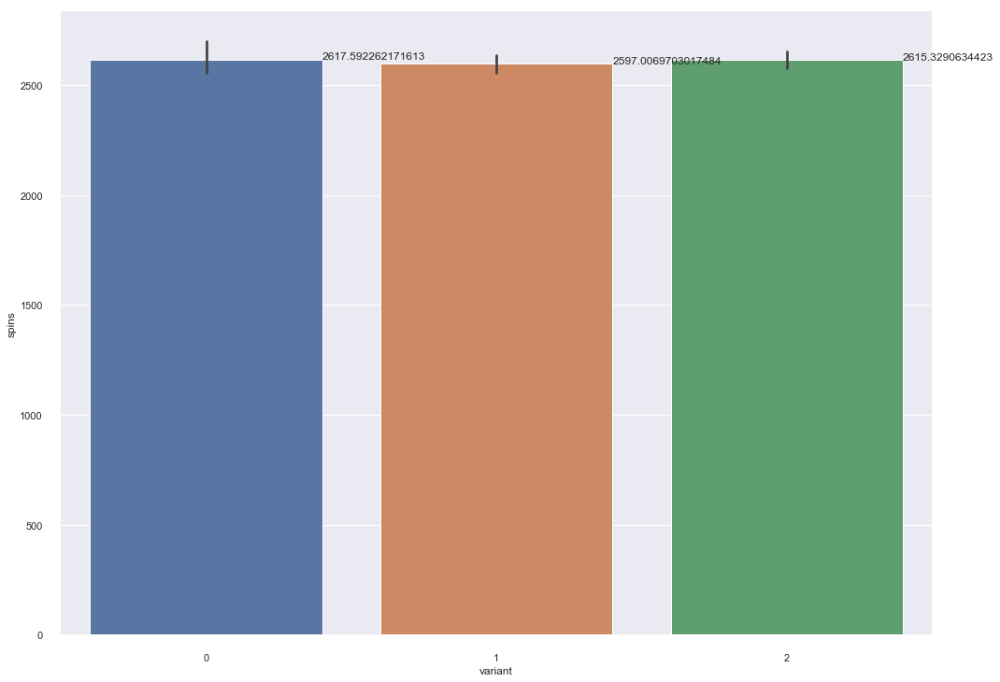

In [15]:
# create a countplot
ax = sns.barplot(x="variant", y="spins", data=df)

for p in ax.patches:
        length = p.get_height()
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()
        ax.annotate(length, (x, y))
# Remove the top and down margin
sns.despine(offset=10, trim=True)
# display the plot
plt.show()

Whoever made more spins during the experient they made a purchase.

# v. Views on Buy Page VS. Variant

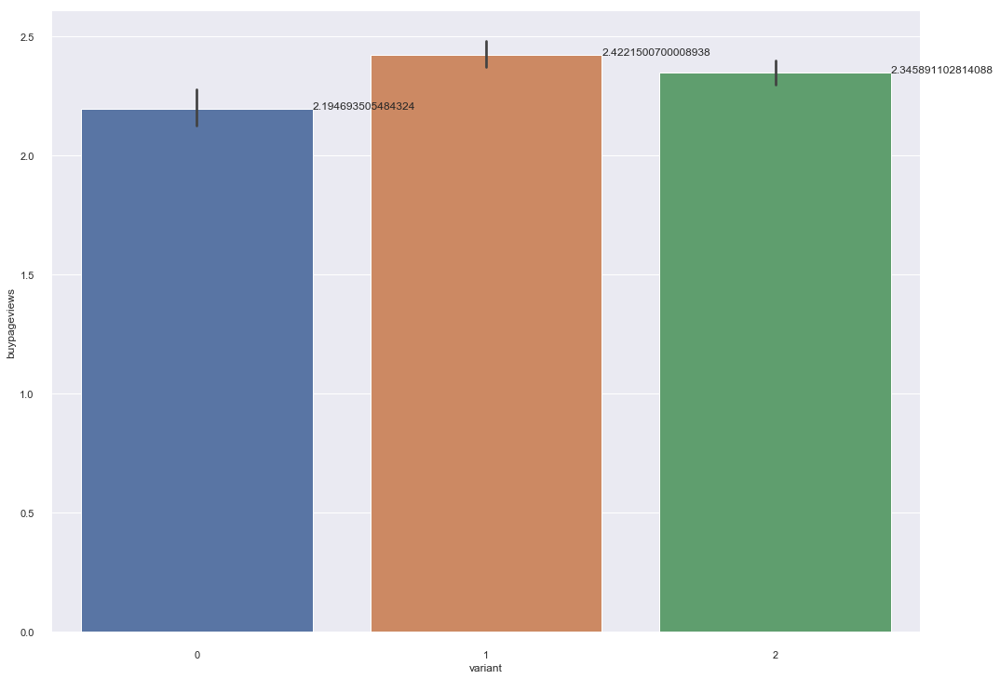

In [16]:
# create a countplot
ax = sns.barplot(x="variant", y="buypageviews", data=df)

for p in ax.patches:
        length = p.get_height()
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()
        ax.annotate(length, (x, y))
# Remove the top and down margin
sns.despine(offset=10, trim=True)
# display the plot
plt.show()

Whoever made more visit to Buy Page during the experient they have made a purchase.

# Data Pre-processing

# i. Handling data types

Using LabelEncoder() method I will convert the categorical labels in our data set into numerical lables. In our dataset not all categories needs to be encoded

In [16]:
#Finding category types of each categorical variable
print("variant : ",df['variant'].unique())
print("u_custom_platform : ",df['u_custom_platform'].unique())
print("playertype : ",df['playertype'].unique())
print("version_name : ",df['version_name'].unique())

variant :  [0 1 2]
u_custom_platform :  ['Amazon' 'iOS' 'Android']
playertype :  ['Existing - NonPayer' 'New' 'Existing - Payer']
version_name :  ['1.16.0' '1.15.0' '1.16.5']


In [17]:
#import the necessary module
from sklearn import preprocessing
# create the Labelencoder object
le = preprocessing.LabelEncoder()
#convert the categorical columns into numeric
df['u_custom_platform'] = le.fit_transform(df['u_custom_platform'])
df['playertype'] = le.fit_transform(df['playertype'])
df['version_name'] = le.fit_transform(df['version_name'])
#display the initial records
df.head()

,variant,entry_date,u_custom_platform,version_name,install_date,first_pay_date,playertype,revenue,bc,txns,heartbeats,spins,buypageviews,d1,d7,d14,revenue_before
0,0,2016-01-30,0,1,2015-08-27,NaT,0,0.0,0,0,19,496,0,1,0,0,0.0
1,0,2016-01-31,0,1,2016-01-01,NaT,0,0.0,0,0,5,106,0,0,0,0,0.0
2,1,2016-01-25,2,0,2016-01-25,NaT,2,0.0,0,0,2,6,0,0,0,0,0.0
3,1,2016-01-27,2,0,2016-01-27,NaT,2,0.0,0,0,11,422,0,0,0,0,0.0
4,1,2016-01-16,1,0,2015-11-05,NaT,0,0.0,0,0,11,176,0,0,0,1,0.0


# ii. Handling Imbalanced Dataset

a. Up-Sampling Minority Class

In this case df['bc']=1 is minority class

In [20]:
df['bc'].value_counts()

0    388970
1     12799
Name: bc, dtype: int64

Out of total 401,769 records, 12,799 are showing that players have made purchase during the of their experiment. This constitutes only 3.18% of total data related to purchase.
Because of such imbalanced data set, the chances of bias analysis increases. To overcome his problem, I performed up-sampling on bc=1.
Up-sampling is the process of randomly duplicating observations from the minority class in order to reinforce its signal.

In [21]:
from sklearn.utils import resample
# Separate majority and minority classes
df_majority = df[df.bc==0]
df_minority = df[df.bc==1]
 
# Upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=388970,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 
# Display new class counts
df_upsampled.bc.value_counts()

1    388970
0    388970
Name: bc, dtype: int64

In [22]:
df_upsampled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 777940 entries, 0 to 432419
Data columns (total 17 columns):
variant              777940 non-null int64
entry_date           777940 non-null datetime64[ns]
u_custom_platform    777940 non-null int32
version_name         777940 non-null int32
install_date         777940 non-null datetime64[ns]
first_pay_date       390681 non-null datetime64[ns]
playertype           777940 non-null int32
revenue              777940 non-null float64
bc                   777940 non-null int64
txns                 777940 non-null int64
heartbeats           777940 non-null int64
spins                777940 non-null int64
buypageviews         777940 non-null int64
d1                   777940 non-null int64
d7                   777940 non-null int64
d14                  777940 non-null int64
revenue_before       777940 non-null float64
dtypes: datetime64[ns](3), float64(2), int32(3), int64(9)
memory usage: 97.9 MB


# Relationship between independent and dependent variables:

Before partitioning the data, I checked data types of the all variables in the data set. And as per data exploration step, I found that the dataset contains categorical as well as numerical data types. After doing required conversion, I looked for other parameters before building a model.
Since the given data set is imbalanced data set, I preferred doing re-sampling of the given data set instead of using original data set.

# ANOVA

In [24]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [25]:
df_anova2 = df_upsampled[['variant','entry_date','version_name','install_date','first_pay_date','u_custom_platform','playertype','revenue','bc','txns','heartbeats','spins','buypageviews','d1','d7','d14','revenue_before']]

In [27]:
model = ols('buypageviews ~ C(variant)*C(bc)', df_anova2).fit()
print(f"Overall model F({model.df_model: .0f},{model.df_resid: .0f}) = {model.fvalue: .3f}, p = {model.f_pvalue: .4f}")

Overall model F( 5, 777934) =  2470.750, p =  0.0000


In [28]:
res = sm.stats.anova_lm(model, typ= 2)
res


,sum_sq,df,F,PR(>F)
C(variant),7.163342e+04,2.0,34.921897,6.827999e-16
C(bc),1.247632e+07,1.0,12164.620019,0.000000e+00
C(variant):C(bc),1.335585e+05,2.0,65.110904,5.309578e-29
Residual,7.978672e+08,777934.0,NaN,NaN


In [29]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           buypageviews   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     2471.
Date:                Thu, 18 Jul 2019   Prob (F-statistic):               0.00
Time:                        23:10:00   Log-Likelihood:            -3.8006e+06
No. Observations:              777940   AIC:                         7.601e+06
Df Residuals:                  777934   BIC:                         7.601e+06
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      1.9112      0.089     21.487      0.000       1.737       2.085
C(variant)[T.1]                0.2746      0.126      2.185      0.029       0.028       0.521
C(variant)[T.2]                0.1948      0.126      1.548      0.122      -0.052       0.442
C(bc)[T.1]                     9.1893      0.126     72.733      0.000       8.942       9.437
C(variant)[T.1]:C(bc)[T.1]    -1.7710      0.178     -9.949      0.000      -2.120      -1.422
C(variant)[T.2]:C(bc)[T.1]    -1.7527      0.178     -9.837      0.000      -2.102      -1.403
==============================================================================
Omnibus:                  2867467.683   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):    1889837555891.662
Skew:                          79.754   Prob(JB):                         0.00
Kurtosis:                    7636.963   Cond. No.                         9.80
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Above model find the relationship between two categorical independent variables against ‘buypageviews’ numerical dependent variable.

a. ANOVA with multiple independent variables.

In [32]:
model = ols('txns ~ C(variant)*C(bc)*C(d1)*C(d7)*C(d14)*C(playertype)', df_anova2).fit()

# Seeing if the overall model is significant
print(f"Overall model F({model.df_model: .0f},{model.df_resid: .0f}) = {model.fvalue: .3f}, p = {model.f_pvalue: .4f}")

Overall model F( 143, 777796) =  687.297, p =  0.0000


In [33]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   txns   R-squared:                       0.112
Model:                            OLS   Adj. R-squared:                  0.112
Method:                 Least Squares   F-statistic:                     687.3
Date:                Thu, 18 Jul 2019   Prob (F-statistic):               0.00
Time:                        23:14:04   Log-Likelihood:            -2.7604e+06
No. Observations:              777940   AIC:                         5.521e+06
Df Residuals:                  777796   BIC:                         5.523e+06
Df Model:                         143                                         
Covariance Type:            nonrobust                                         
===================================================================================================================================================
                                                                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------------------------------------------
Intercept                                                                        1.655e-13      0.060   2.75e-12      1.000      -0.118       0.118
C(variant)[T.1]                                                                 -1.042e-14      0.085  -1.23e-13      1.000      -0.166       0.166
C(variant)[T.2]                                                                  1.022e-14      0.085    1.2e-13      1.000      -0.167       0.167
C(bc)[T.1]                                                                          1.6381      0.182      8.999      0.000       1.281       1.995
C(d1)[T.1]                                                                      -2.813e-14      0.101  -2.77e-13      1.000      -0.199       0.199
C(d7)[T.1]                                                                      -2.023e-16      0.147  -1.38e-15      1.000      -0.287       0.287
C(d14)[T.1]                                                                     -2.693e-14      0.231  -1.17e-13      1.000      -0.452       0.452
C(playertype)[T.1]                                                              -4.527e-14      0.797  -5.68e-14      1.000      -1.562       1.562
C(playertype)[T.2]                                                              -4.496e-15      0.077  -5.84e-14      1.000      -0.151       0.151
C(variant)[T.1]:C(bc)[T.1]                                                          0.6559      0.260      2.527      0.012       0.147       1.165
C(variant)[T.2]:C(bc)[T.1]                                                         -0.1262      0.261     -0.484      0.628      -0.637       0.385
C(variant)[T.1]:C(d1)[T.1]                                                      -1.385e-15      0.143  -9.65e-15      1.000      -0.281       0.281
C(variant)[T.2]:C(d1)[T.1]                                                       1.015e-15      0.143   7.08e-15      1.000      -0.281       0.281
C(bc)[T.1]:C(d1)[T.1]                                                               0.0965      0.267      0.362      0.717      -0.426       0.619
C(variant)[T.1]:C(d7)[T.1]                                                       1.751e-15      0.208   8.44e-15      1.000      -0.407       0.407
C(variant)[T.2]:C(d7)[T.1]                                                      -5.428e-15      0.207  -2.62e-14      1.000      -0.407       0.407
C(bc)[T.1]:C(d7)[T.1]                                                               0.1252      0.348      0.360      0.719      -0.556       0.806
C(d1)[T.1]:C(d7)[T.1]                                                            2.298e-14      0.190   1.21e-13      1.000

In above model found better R-square value

b. ANOVA with multiple independent variables.

In [34]:
model = ols('txns ~ C(bc)*C(d1)*C(d7)*C(d14)*C(playertype)', df_anova2).fit()

# Seeing if the overall model is significant
print(f"Overall model F({model.df_model: .0f},{model.df_resid: .0f}) = {model.fvalue: .3f}, p = {model.f_pvalue: .4f}")


Overall model F( 47, 777892) =  2061.681, p =  0.0000


In [35]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   txns   R-squared:                       0.111
Model:                            OLS   Adj. R-squared:                  0.111
Method:                 Least Squares   F-statistic:                     2062.
Date:                Thu, 18 Jul 2019   Prob (F-statistic):               0.00
Time:                        23:16:30   Log-Likelihood:            -2.7611e+06
No. Observations:              777940   AIC:                         5.522e+06
Df Residuals:                  777892   BIC:                         5.523e+06
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
===================================================================================================================================
                                                                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------------------------
Intercept                                                        1.075e-12      0.035    3.1e-11      1.000      -0.068       0.068
C(bc)[T.1]                                                          1.8146      0.107     17.015      0.000       1.606       2.024
C(d1)[T.1]                                                       1.008e-13      0.059   1.72e-12      1.000      -0.115       0.115
C(d7)[T.1]                                                       8.987e-15      0.085   1.06e-13      1.000      -0.166       0.166
C(d14)[T.1]                                                      6.668e-14      0.133   5.01e-13      1.000      -0.261       0.261
C(playertype)[T.1]                                              -4.951e-13      0.463  -1.07e-12      1.000      -0.908       0.908
C(playertype)[T.2]                                               4.336e-14      0.044   9.77e-13      1.000      -0.087       0.087
C(bc)[T.1]:C(d1)[T.1]                                               0.2722      0.153      1.780      0.075      -0.028       0.572
C(bc)[T.1]:C(d7)[T.1]                                               0.4082      0.201      2.030      0.042       0.014       0.802
C(d1)[T.1]:C(d7)[T.1]                                           -2.227e-14      0.110  -2.02e-13      1.000      -0.216       0.216
C(bc)[T.1]:C(d14)[T.1]                                              0.4756      0.298      1.597      0.110      -0.108       1.059
C(d1)[T.1]:C(d14)[T.1]                                          -1.198e-14      0.176  -6.79e-14      1.000      -0.346       0.346
C(d7)[T.1]:C(d14)[T.1]                                           2.143e-14      0.189   1.13e-13      1.000      -0.371       0.371
C(bc)[T.1]:C(playertype)[T.1]                                       0.4826      0.480      1.006      0.314      -0.457       1.423
C(bc)[T.1]:C(playertype)[T.2]                                       0.3746      0.124      3.012      0.003       0.131       0.618
C(d1)[T.1]:C(playertype)[T.1]                                   -4.336e-14      0.685  -6.33e-14      1.000      -1.344       1.344
C(d1)[T.1]:C(playertype)[T.2]                                   -7.691e-15      0.074  -1.04e-13      1.000      -0.145       0.145
C(d7)[T.1]:C(playertype)[T.1]                                     2.29e-13      1.057   2.17e-13      1.000      -2.072       2.072
C(d7)[T.1]:C(playertype)[T.2]                                    6.081e-14      0.145    4.2e-13      1.000      -0.284       0.284
C(d14)[T.1]:C(playertype)[T.1]                                   1.951e-13      1.719   1.13e-13      1.000      -3.370       3.370
C(d14)[T.1]:C(playertype)[T.2]                 

# Partitioning into Training Set & Test Set

Since the dataset has datetime variables, scikit learn will not be able to handle datetime data type. Eliminating datetime variables from datasets, we can perform prediction.

In [36]:
#getting the data
data = df[['playertype','variant','d1','d7','d14','spins','buypageviews']]

#assigning the 'variant' column as target because we are checkig which all factors are attracting players to make a purchase
target = df.iloc[:,8]

The train_test_split() method in scikit-learn can be used to split the data.I am keeping aside 20% of the data as test data.

In [37]:
#import the necessary module
from sklearn.model_selection import train_test_split

In [38]:
#split data set into train and test sets. 20% data is used for testing the model.
data_train, data_test, target_train, target_test = train_test_split(data,target, test_size = 0.20, random_state = 10)

# Building a Model

I have built a prediction model. Since our data has multiple classes and also our target variable a categorical variable, I preferred below algorithms. However, before going ahead with any algorithms I checked few things. Such as:

More than 50 samples – Check 
Are we predicting a category – Check 
We have labeled data? ( data with clear names like opportunity amount etc.) – Check
Check Less than 100k samples – Check

Based on the checklist that I prepared above and I am going to try out the below mentioned algorithms.

1. Naive Bayes
2. Decision Tree Analysis

We can also use following data algorithm for prediction and classification of this data set. I will use them later.
1. Linear SVC
2. K-Neighbours Classifier
3. Multinomial Regression

# 1. a. Naive Bayes

On a very high level a Naive-Bayes algorithm calculates the probability of the connection of a feature with a target variable and then it selects the feature with the highest probability.

In [39]:
# import the necessary module
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

In [40]:
#create an object of the type GaussianNB
gnb = GaussianNB()

In [41]:
#train the algorithm on training data and predict using the testing data
pred = gnb.fit(data_train, target_train).predict(data_test)

In [42]:
#print the accuracy score of the model
print("Naive-Bayes accuracy : ",accuracy_score(target_test, pred, normalize = True))

Naive-Bayes accuracy :  0.9558827189685641


In [43]:
rs = np.random.RandomState(0)
corr = data.corr()
corr.style.background_gradient(cmap='summer').set_precision(2)

,playertype,variant,d1,d7,d14,spins,buypageviews
playertype,1,-0.0014,-0.13,-0.32,-0.36,-0.056,0.036
variant,-0.0014,1,-0.00063,-0.00012,0.0036,-9.5e-05,0.0053
d1,-0.13,-0.00063,1,0.42,0.34,0.17,0.1
d7,-0.32,-0.00012,0.42,1,0.55,0.22,0.11
d14,-0.36,0.0036,0.34,0.55,1,0.23,0.092
spins,-0.056,-9.5e-05,0.17,0.22,0.23,1,0.55
buypageviews,0.036,0.0053,0.1,0.11,0.092,0.55,1


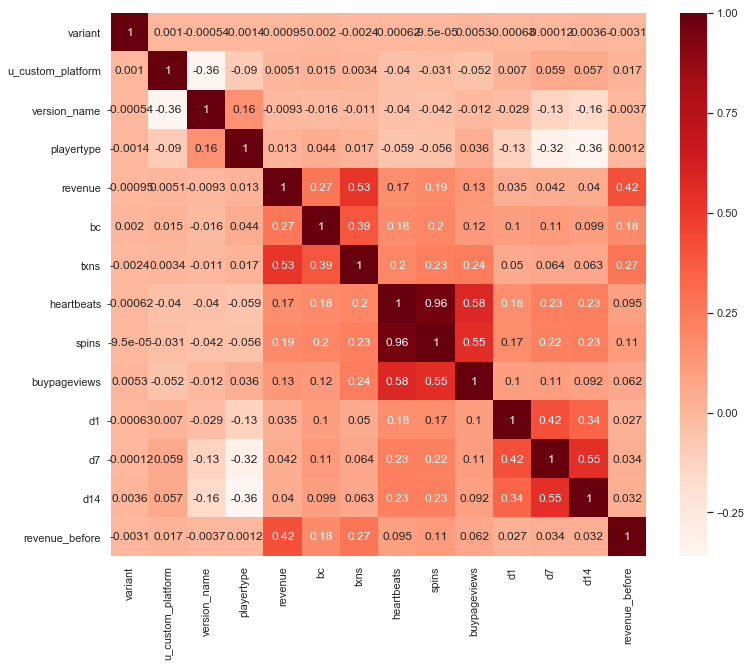

In [44]:
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [45]:
from sklearn.metrics import confusion_matrix
print('Confusion Matrix:')
unique_label = np.unique(target_test)
print(pd.DataFrame(confusion_matrix(target_test, pred,labels = unique_label)))

Confusion Matrix:
       0     1
0  76351  1424
1   2121   458


As we can see, the amount of errors is pretty balanced between purchase made and purchase was not made.  
1424 records whhich show that the user has NOT made purchase is classified as those records where users have made purchase.
2121 purchase records were classified as purchase NOT made.

In [46]:
from sklearn.metrics import classification_report
print(classification_report(target_test, pred))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98     77775
           1       0.24      0.18      0.21      2579

   micro avg       0.96      0.96      0.96     80354
   macro avg       0.61      0.58      0.59     80354
weighted avg       0.95      0.96      0.95     80354



In [30]:
df['bc'].value_counts()

0    388970
1     12799
Name: bc, dtype: int64

# 1. b, Naive Bayes with Resampled Data

Checking the accuracy again

In [47]:
#getting the data
data_up = df[['playertype','variant','d1','d7','d14','spins','buypageviews']]

#assigning the 'bc' column as target 
#because we are checkig which all factors are attracting players to make a purchase
target_up = df.iloc[:,8]

In [48]:
#split data set into train and test sets
data_train_up, data_test_up, target_train_up, target_test_up = train_test_split(data_up,target_up, test_size = 0.20, random_state = 10)

In [49]:
#create an object of the type GaussianNB
gnb_up = GaussianNB()

In [50]:
#train the algorithm on training data and predict using the testing data
pred_up = gnb_up.fit(data_train_up, target_train_up).predict(data_test_up)

In [51]:
#print the accuracy score of the model
print("Naive-Bayes accuracy_after resampling : ",accuracy_score(target_test_up, pred_up, normalize = True))

Naive-Bayes accuracy_after resampling :  0.9558827189685641


In [52]:
print(classification_report(target_test_up, pred_up))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98     77775
           1       0.24      0.18      0.21      2579

   micro avg       0.96      0.96      0.96     80354
   macro avg       0.61      0.58      0.59     80354
weighted avg       0.95      0.96      0.95     80354



# 2. a. Decision Tree Analysis

From Above confusion matrix I select some features to check the prediction for variant.

In [53]:
# Importing libraries

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.externals import joblib

In [54]:
#Splitting the data into independent and dependent variables
X = df[['variant','d1','d7','d14','spins','buypageviews']] # independent features set
y = df[['bc']]

In [55]:
# Split dataset into training set and test set

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1) # 80% training and 30% test

In [56]:
# Create Decision Tree classifer object
from sklearn.tree import DecisionTreeClassifier 


clf = DecisionTreeClassifier(criterion="entropy", max_depth=7)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [57]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",accuracy_score(y_test, y_pred))

Accuracy: 0.9681285312492222


In [58]:
unique_label = np.unique(y_test)

In [59]:
#confusion matrix
confusion_matrix(y_test, y_pred)


print(pd.DataFrame(confusion_matrix(y_test, y_pred, labels = unique_label)))


       0    1
0  77686   51
1   2510  107


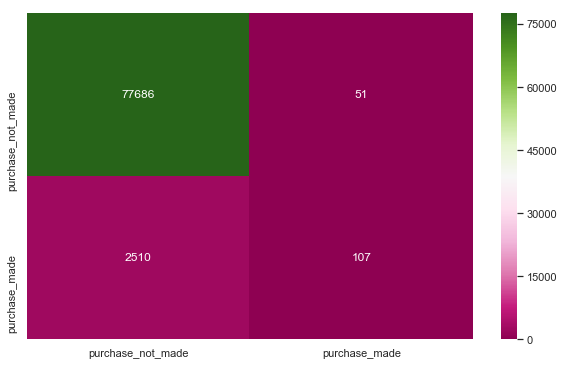

In [60]:
# Model confusion matrix, how often is the classifier correct?
cm = confusion_matrix(y_test, y_pred)

index = ['purchase_not_made','purchase_made']  
cols1 = ['purchase_not_made','purchase_made']  
cm_df = pd.DataFrame(cm,cols1,index)                      
plt.figure(figsize=(10,6))  
sns.heatmap(cm_df, annot=True,cmap='PiYG', fmt='g')


#print(cm)

In [61]:
#Classification report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98     77737
           1       0.68      0.04      0.08      2617

   micro avg       0.97      0.97      0.97     80354
   macro avg       0.82      0.52      0.53     80354
weighted avg       0.96      0.97      0.95     80354



# 1.b. Decision Tree Analysis on Resampled data

In [63]:
col_names = ['variant','d1','d7','d14','spins','buypageviews']
col_names

['variant', 'd1', 'd7', 'd14', 'spins', 'buypageviews']

In [64]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from sklearn import tree

In [65]:
from IPython.display import Image  
import pydotplus

In [66]:
dot_data = StringIO()

export_graphviz(clf, out_file=dot_data,  feature_names = col_names, filled=True, rounded=True, class_names=['0','1'])


In [67]:
#dot_data = tree.export_graphviz(clf,
 #                               feature_names=X,
  #                              out_file=None,
   #                             filled=True,
    #                            rounded=True)

In [68]:
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  


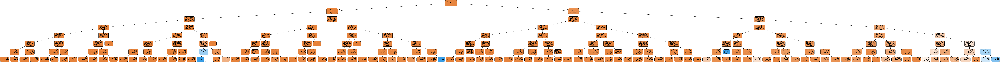

In [69]:
Image(graph.create_png())

# Getting the accurate model with resampled data.

In [75]:
#getting the data
data_up_dec = df_upsampled[['variant','d1','d7','d14','spins','buypageviews']] 

#assigning the 'variant' column as target because we are checkig which all factors are attracting players to make a purchase
target_up_dec = df_upsampled.iloc[:,8]

In [76]:
#split data set into train and test sets
data_train_up_dec, data_test_up_dec, target_train_up_dec, target_test_up_dec = train_test_split(data_up_dec,target_up_dec, test_size = 0.20, random_state = 10)

In [77]:
# Create Decision Tree classifer object

clf_up = DecisionTreeClassifier(criterion="entropy",max_depth=7)

# Train Decision Tree Classifer
clf_up = clf_up.fit(data_train_up_dec,target_train_up_dec)

#Predict the response for test dataset
y_pred_dec = clf_up.predict(data_test_up_dec)

In [78]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",accuracy_score(target_test_up_dec, y_pred_dec))

Accuracy: 0.8076651155616115


In [79]:
print(classification_report(target_test_up_dec, y_pred_dec))

              precision    recall  f1-score   support

           0       0.83      0.78      0.80     77813
           1       0.79      0.84      0.81     77775

   micro avg       0.81      0.81      0.81    155588
   macro avg       0.81      0.81      0.81    155588
weighted avg       0.81      0.81      0.81    155588



In [80]:
dot_data_up = StringIO()

export_graphviz(clf_up, out_file=dot_data_up,  feature_names = col_names, filled=True, rounded=True, class_names=['0','1'])


In [81]:
graph_up = pydotplus.graph_from_dot_data(dot_data_up.getvalue())  


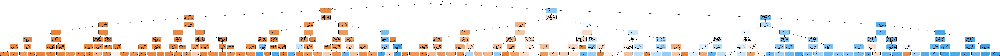

In [82]:
Image(graph_up.create_png())



For sampled data
Variant 0 or 1 can be used to predict if the player is going to make purchase or not, depends on
1. If the number of spins are greater than 73068 but less than 110351 then out of 79 players 78 make a purchase, with entropy of 9.8% only.

In [83]:
data_up_dec.variant.value_counts() #260,300   (.6= 468,541, ) (.2=156,180) (.5= 390,451,.25=195,225) (.7=546,631,.15=117,135)

1    260931
2    259985
0    257024
Name: variant, dtype: int64

# Handling Imbalanced Class

Now, as we have determined the decision tree y balancing data, I believe we can try changing occurences of variant. 
1. By distributing same number of occurences
2. Making variant 2 greater than the rest of the two variants

# 1.c. By distributing equal number of occurences for every variant and then determinig the purchase

In [84]:
# Separate majority and minority classes
df_v0 = df_upsampled[df_upsampled.variant==0]
df_v1 = df_upsampled[df_upsampled.variant==1]
df_v2 = df_upsampled[df_upsampled.variant==2]
 
# Upsample class
df_v0_upsampled = resample(df_v0, 
                                 replace=True,     # sample with replacement
                                 n_samples=260301,    # to match majority class
                                 random_state=123) # reproducible results

df_v1_upsampled = resample(df_v1, 
                                 replace=True,     # sample with replacement
                                 n_samples=260300,    # to match majority class
                                 random_state=123) # reproducible results

df_v2_upsampled = resample(df_v2, 
                                 replace=True,     # sample with replacement
                                 n_samples=260300,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled_variants = pd.concat([df_v0_upsampled, df_v1_upsampled,df_v2_upsampled])
 
# Display new class counts
print(df_upsampled_variants.variant.value_counts())
print(df_upsampled_variants.bc.value_counts())

0    260301
2    260300
1    260300
Name: variant, dtype: int64
0    391300
1    389601
Name: bc, dtype: int64


In [85]:
#getting the data
data_up_dec_var = df_upsampled_variants[['variant','d1','d7','d14','spins','buypageviews']] 

#assigning the 'variant' column as target because we are checkig which all factors are attracting players to make a purchase
target_up_dec_var = df_upsampled_variants.iloc[:,8]

In [86]:
#split data set into train and test sets
data_train_up_dec_v, data_test_up_dec_v, target_train_up_dec_v, target_test_up_dec_v = train_test_split(data_up_dec_var,target_up_dec_var, test_size = 0.20, random_state = 10)

In [87]:
# Create Decision Tree classifer object

clf_up_var = DecisionTreeClassifier(criterion="entropy",max_depth=7)

# Train Decision Tree Classifer
clf_up_var = clf_up_var.fit(data_train_up_dec_v,target_train_up_dec_v)

#Predict the response for test dataset
y_pred_dec_v = clf_up_var.predict(data_test_up_dec_v)

In [88]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy: after resampling Variants",accuracy_score(target_test_up_dec_v, y_pred_dec_v))

Accuracy: after resampling Variants 0.8066474154986842


In [89]:
print(classification_report(target_test_up_dec_v, y_pred_dec_v))

              precision    recall  f1-score   support

           0       0.83      0.77      0.80     78116
           1       0.79      0.84      0.81     78065

   micro avg       0.81      0.81      0.81    156181
   macro avg       0.81      0.81      0.81    156181
weighted avg       0.81      0.81      0.81    156181



In [90]:
dot_data_up_v = StringIO()

export_graphviz(clf_up_var, out_file=dot_data_up_v,  feature_names = col_names, filled=True, rounded=True, class_names=['0','1'])

In [91]:
graph_up_v = pydotplus.graph_from_dot_data(dot_data_up_v.getvalue())  


There is no impact because of any variants

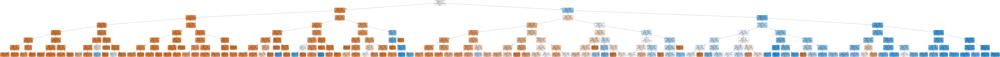

In [92]:
Image(graph_up_v.create_png())

# 1.d. Making one of the variants greater than the rest of the two variants

# ** Taking Variant 1 = 60% of overall Variant1 data and rest of the data will be equally distributed

In [93]:
data_up_dec.variant.value_counts() #260,300   
#(.6= 468,541, ) (.2=156,180) 
#(.7=546,631,.15=117,135)

1    260931
2    259985
0    257024
Name: variant, dtype: int64

In [94]:

# Sampling class
df_v0_upsampled20 = resample(df_v0, 
                                 replace=True,     # sample with replacement
                                 n_samples=156180,    # to match majority class
                                 random_state=123) # reproducible results

df_v1_upsampled60 = resample(df_v1, 
                                 replace=True,     # sample with replacement
                                 n_samples=468541,    # to match majority class
                                 random_state=123) # reproducible results

df_v2_upsampled20 = resample(df_v2, 
                                 replace=True,     # sample with replacement
                                 n_samples=156180,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled_variants6040 = pd.concat([df_v0_upsampled20, df_v1_upsampled60,df_v2_upsampled20])
 
# Display new class counts
print(df_upsampled_variants6040.variant.value_counts())

1    468541
2    156180
0    156180
Name: variant, dtype: int64


In [95]:
#getting the data
data_up_dec_var6040 = df_upsampled_variants[['variant','d1','d7','d14','spins','buypageviews']] 

#assigning the 'variant' column as target because we are checkig which all factors are attracting players to make a purchase
target_up_dec_var6040 = df_upsampled_variants.iloc[:,8]

#split data set into train and test sets
data_train_up_dec_v6040, data_test_up_dec_v6040, target_train_up_dec_v6040, target_test_up_dec_v6040 = train_test_split(data_up_dec_var6040,target_up_dec_var6040, test_size = 0.20, random_state = 10)



In [96]:
# Create Decision Tree classifer object

clf_up_var6040 = DecisionTreeClassifier(criterion="entropy",max_depth=7)

# Train Decision Tree Classifer
clf_up_var6040 = clf_up_var6040.fit(data_train_up_dec_v6040,target_train_up_dec_v6040)

#Predict the response for test dataset
y_pred_dec_v6040 = clf_up_var6040.predict(data_test_up_dec_v6040)

In [97]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy: after resampling Variants",accuracy_score(target_test_up_dec_v6040, y_pred_dec_v6040))

print(classification_report(target_test_up_dec_v6040, y_pred_dec_v6040))

Accuracy: after resampling Variants 0.8066474154986842
              precision    recall  f1-score   support

           0       0.83      0.77      0.80     78116
           1       0.79      0.84      0.81     78065

   micro avg       0.81      0.81      0.81    156181
   macro avg       0.81      0.81      0.81    156181
weighted avg       0.81      0.81      0.81    156181



In [98]:
dot_data_up_v6040 = StringIO()

export_graphviz(clf_up_var6040, out_file=dot_data_up_v6040,  feature_names = col_names, filled=True, rounded=True, class_names=['0','1'])

In [99]:
graph_up_v6040 = pydotplus.graph_from_dot_data(dot_data_up_v6040.getvalue())  

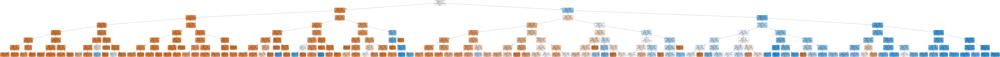

In [100]:
Image(graph_up_v6040.create_png())

#    ** Taking Variant 2 = 60% of overall Variant1 data and rest of the data will be equally distributed

In [101]:
# Sampling class
df_v0_upsampled20 = resample(df_v0, 
                                 replace=True,     # sample with replacement
                                 n_samples=156180,    # to match majority class
                                 random_state=123) # reproducible results

df_v1_upsampled20 = resample(df_v1, 
                                 replace=True,     # sample with replacement
                                 n_samples=156180,    # to match majority class
                                 random_state=123) # reproducible results

df_v2_upsampled60 = resample(df_v2, 
                                 replace=True,     # sample with replacement
                                 n_samples=468541,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled_variants2_6040 = pd.concat([df_v0_upsampled20, df_v1_upsampled20,df_v2_upsampled60])
 
# Display new class counts
print(df_upsampled_variants2_6040.variant.value_counts())

2    468541
1    156180
0    156180
Name: variant, dtype: int64


In [102]:
#getting the data
data_up_dec_var2_6040 = df_upsampled_variants[['variant','d1','d7','d14','spins','buypageviews']] 

#assigning the 'variant' column as target because we are checkig which all factors are attracting players to make a purchase
target_up_dec_var2_6040 = df_upsampled_variants.iloc[:,8]

#split data set into train and test sets
data_train_up_dec_v2_6040, data_test_up_dec_v2_6040, target_train_up_dec_v2_6040, target_test_up_dec_v2_6040 = train_test_split(data_up_dec_var2_6040,target_up_dec_var2_6040, test_size = 0.20, random_state = 10)

In [103]:
# Create Decision Tree classifer object

clf_up_var2_6040 = DecisionTreeClassifier(criterion="entropy",max_depth=7)

# Train Decision Tree Classifer
clf_up_var2_6040 = clf_up_var2_6040.fit(data_train_up_dec_v2_6040,target_train_up_dec_v2_6040)

#Predict the response for test dataset
y_pred_dec_v2_6040 = clf_up_var2_6040.predict(data_test_up_dec_v2_6040)

In [104]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy: after resampling Variants",accuracy_score(target_test_up_dec_v2_6040, y_pred_dec_v2_6040))

print(classification_report(target_test_up_dec_v2_6040, y_pred_dec_v2_6040))

Accuracy: after resampling Variants 0.8066474154986842
              precision    recall  f1-score   support

           0       0.83      0.77      0.80     78116
           1       0.79      0.84      0.81     78065

   micro avg       0.81      0.81      0.81    156181
   macro avg       0.81      0.81      0.81    156181
weighted avg       0.81      0.81      0.81    156181



In [105]:
dot_data_up_v2_6040 = StringIO()

export_graphviz(clf_up_var2_6040, out_file=dot_data_up_v2_6040,  feature_names = col_names, filled=True, rounded=True, class_names=['0','1'])

In [106]:
graph_up_v2_6040 = pydotplus.graph_from_dot_data(dot_data_up_v2_6040.getvalue())  

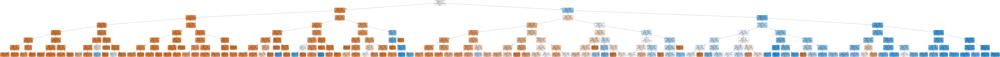

In [107]:
Image(graph_up_v2_6040.create_png())

Irrespective of the variant, a player will mostly likely (73%) make a purchase if he/she visits the Buy Page for 5 to 7 times in week from the day the player has entered the experiment. However, a good spin of more than 8,946 is required.

Variant, d1 on buypageviews

In [108]:
correl = df_upsampled[['variant','entry_date','version_name','install_date','first_pay_date','u_custom_platform','playertype','revenue','bc','txns','heartbeats','spins','buypageviews','d1','d7','d14','revenue_before']]

In [109]:
gfjhd = correl.corr()
gfjhd.style.background_gradient(cmap='BrBG').set_precision(2)

,variant,version_name,u_custom_platform,playertype,revenue,bc,txns,heartbeats,spins,buypageviews,d1,d7,d14,revenue_before
variant,1,-0.0038,0.0068,-0.0078,-0.0049,0.0056,-0.011,-0.0022,-0.001,-0.0079,0.0039,0.0055,0.013,-0.015
version_name,-0.0038,1,-0.36,0.14,-0.032,-0.047,-0.035,-0.036,-0.041,-0.023,-0.035,-0.14,-0.19,-0.0086
u_custom_platform,0.0068,-0.36,1,-0.056,0.014,0.041,0.0022,-0.03,-0.023,-0.024,0.028,0.051,0.046,0.049
playertype,-0.0078,0.14,-0.056,1,0.033,0.14,0.041,-0.013,-0.011,0.021,-0.038,-0.22,-0.3,-0.013
revenue,-0.0049,-0.032,0.014,0.033,1,0.2,0.51,0.18,0.21,0.18,0.096,0.11,0.1,0.44
bc,0.0056,-0.047,0.041,0.14,0.2,1,0.29,0.16,0.17,0.12,0.3,0.31,0.25,0.13
txns,-0.011,-0.035,0.0022,0.041,0.51,0.29,1,0.21,0.24,0.33,0.14,0.16,0.16,0.26
heartbeats,-0.0022,-0.036,-0.03,-0.013,0.18,0.16,0.21,1,0.98,0.85,0.12,0.16,0.18,0.097
spins,-0.001,-0.041,-0.023,-0.011,0.21,0.17,0.24,0.98,1,0.82,0.13,0.17,0.19,0.12
buypageviews,-0.0079,-0.023,-0.024,0.021,0.18,0.12,0.33,0.85,0.82,1,0.088,0.1,0.1,0.081


From above correlation matrix it is clear that bc is mostly dependent on d1, d7, d14, playertype and spins. It is less likely related with variants.

# Chi-square between two categorical values

In [110]:
contingency_table=pd.crosstab(df_anova2["bc"],df_anova2["d1"])
print('contingency_table :-\n',contingency_table)

contingency_table :-
 d1       0       1
bc                
0   180785  208185
1    70970  318000


In [111]:
#Observed Values
Observed_Values = contingency_table.values 
print("Observed Values :-\n",Observed_Values)

Observed Values :-
 [[180785 208185]
 [ 70970 318000]]


In [112]:
#Expected Values
import scipy.stats
b=scipy.stats.chi2_contingency(contingency_table)
Expected_Values = b[3]
print("Expected Values :-\n",Expected_Values)

Expected Values :-
 [[125877.5 263092.5]
 [125877.5 263092.5]]


In [113]:
#Degree of Freedom
no_of_rows=len(contingency_table.iloc[0:2,0])
no_of_columns=len(contingency_table.iloc[0,0:2])
df=(no_of_rows-1)*(no_of_columns-1)
print("Degree of Freedom:-",df)

Degree of Freedom:- 1


In [114]:
#Significance Level 5%
alpha=0.05

In [115]:
#chi-square statistic - χ2
from scipy.stats import chi2
chi_square=sum([(o-e)**2./e for o,e in zip(Observed_Values,Expected_Values)])
chi_square_statistic=chi_square[0]+chi_square[1]
print("chi-square statistic:-",chi_square_statistic)

chi-square statistic:- 70819.50163633894


In [116]:
#critical_value
critical_value=chi2.ppf(q=1-alpha,df=df)
print('critical_value:',critical_value)

critical_value: 3.841458820694124


In [117]:
#p-value
p_value=1-chi2.cdf(x=chi_square_statistic,df=df)
print('p-value:',p_value)

p-value: 0.0


In [118]:
#compare chi_square_statistic with critical_value and p-value which is the probability of getting chi-square>0.09 (chi_square_statistic)
if chi_square_statistic>=critical_value:
    print("Reject H0,There is a relationship between 2 categorical variables")
else:
    print("Retain H0,There is no relationship between 2 categorical variables")
    
if p_value<=alpha:
    print("Reject H0,There is a relationship between 2 categorical variables")
else:
    print("Retain H0,There is no relationship between 2 categorical variables")

Reject H0,There is a relationship between 2 categorical variables
Reject H0,There is a relationship between 2 categorical variables


Recommendations:
1. Engaging factors such as Spins and heartbeats are required to acquire and sustain existing of players.
2. Adding more engaging features would be beneficial.
3. Rewarding existing players would be beneficial to keep them engaged and attracted towards the game.